#NOTE

> **Please upload all the required files, before running the notebook. For this notebook the required files are - eggs.jpg, Nepal.jpg, boy.jpg**


## Color features and histogram

In [ ]:
!pip install utils

## (Tutorial) Dominant colors
Please refer to the following link to learn how to extract dominant colors of a given image:<br>
https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/

## Extracting dominant colors

In [ ]:
# import the necessary packages

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import argparse
import utils
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

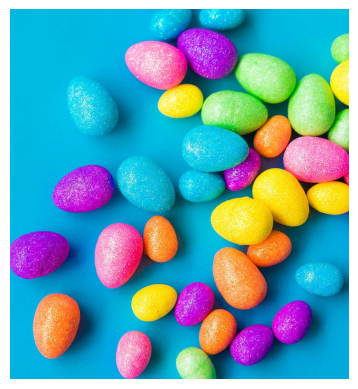

In [ ]:
# load the image and convert it from BGR to RGB so that
# we can dispaly it with matplotlib
image = cv2.imread("eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)

In [ ]:
# reshape the image to proper version for the following processing
image = image.reshape((image.shape[0] * image.shape[1], 3))

In [ ]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 10)
clt.fit(image)

KMeans(n_clusters=10)

In [ ]:
# import the necessary packages
import numpy as np
import cv2
def centroid_histogram(clt):
# grab the number of different clusters and create a histogram
# based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
# normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
# return the histogram
    return hist

In [ ]:
def plot_colors(hist, centroids):
# initialize the bar chart representing the relative frequency
# of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
# loop over the percentage of each cluster and the color of
# each cluster
    for (percent, color) in zip(hist, centroids):
# plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

# return the bar chart
    return bar

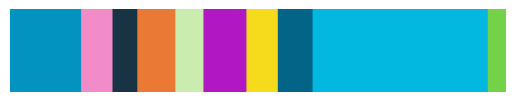

In [ ]:
# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## Within-Cluster Sum of Square (wcss) and Elbow method
Please refer to the following link to learn Elbow method for optimal number of clusters selecting:<br>
https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/

## Using the Elbow method to select the optimal number of clusters for images


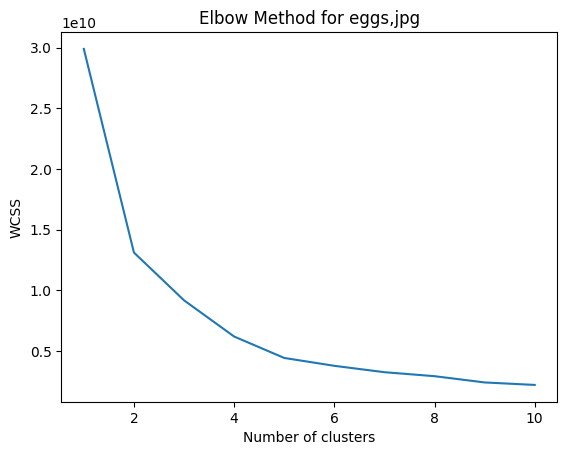

In [ ]:
#FOR EGGS.JPG

img = cv2.imread("eggs.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.reshape((img.shape[0] * img.shape[1], 3))
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(img)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for eggs,jpg')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

The point where the WCSS starts to decrease at a slower rate is considered the "elbow," representing the optimal number of clusters.

In the above graph, we can observe that 4 or 5 is the optimal number of clusters needed since we see the "elbow" at that time. We chose the optimal k as 4.

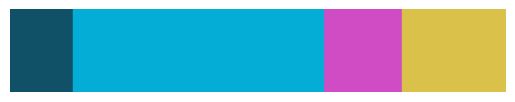

In [ ]:
optimal_k = 4
k_egg = KMeans(n_clusters=optimal_k)
k_egg.fit(img)

hist = centroid_histogram(k_egg)
bar = plot_colors(hist, k_egg.cluster_centers_)

plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

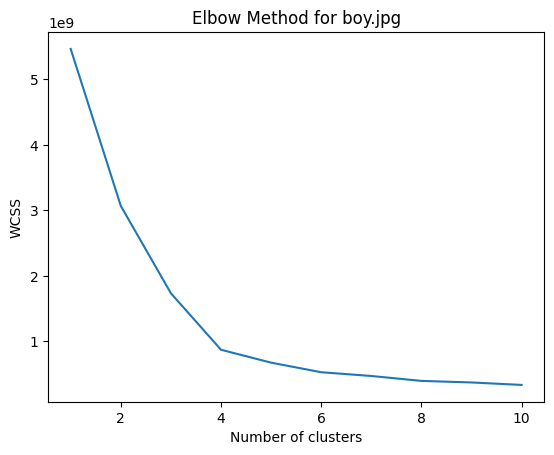

In [ ]:
#FOR BOY.JPG

img = cv2.imread("boy.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.reshape((img.shape[0] * img.shape[1], 3))
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(img)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for boy.jpg')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Here, the optimal point is 4. so we create 4 clusters.

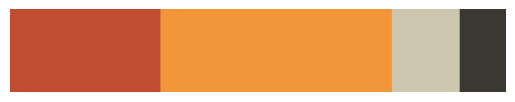

In [ ]:
optimal_k = 4
k_boy = KMeans(n_clusters=optimal_k)
k_boy.fit(img)

hist = centroid_histogram(k_boy)
bar = plot_colors(hist, k_boy.cluster_centers_)

plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

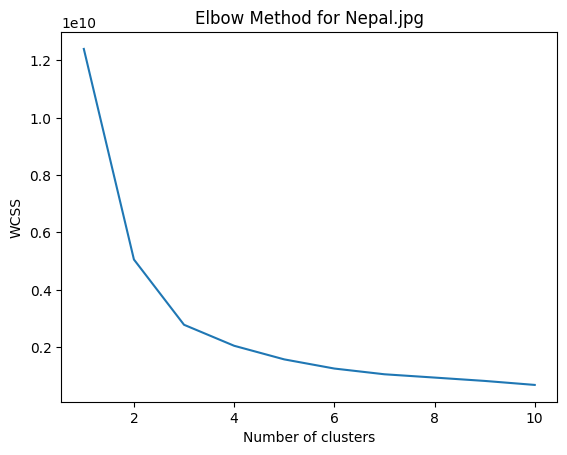

In [ ]:
#FOR NEPAL.JPG

img = cv2.imread("Nepal.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.reshape((img.shape[0] * img.shape[1], 3))
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(img)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for Nepal.jpg')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Here, the optimal point is 3. So, we create 3 clusters.

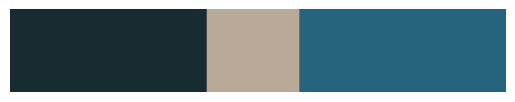

In [ ]:
optimal_k = 3
k_nep = KMeans(n_clusters=optimal_k)
k_nep.fit(img)

hist = centroid_histogram(k_nep)
bar = plot_colors(hist, k_nep.cluster_centers_)

plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## According to the Elbow method, how to choose the optimal number of clusters?

**Answer**:

The Elbow method is one of the most common techniques to determine the optimal value of K to use for K-means clustering. Essentially, this technique involves plotting the within-cluster sum of squared errors(WCSS) versus the number of clusters, (K). WCSS is a compactness measure for each cluster, explaining to what extent the data points in each cluster are well related to the centroid of the cluster. For an increasing `K`, WCSS decreases because more clusters create tighter groups. The Key goal of the Elbow method is to identify a point of WCSS, which decreases at a lesser rate upon adding more clusters, forming an "elbow" shape on the graph. That elbow is a point where a trade-off between model complexity and performance exists. Before the elbow, the number of clusters radically strengthens the model, whereas beyond the elbow greater increases in `K` result in fewer returns-additional clusters making very little difference to a better fit. And around this bend, the optimal number of clusters is chosen to strike a balance between simplicity and accuracy.


---

## (Tutorial) Histogram Equalization
Please refer to the following link to learn the histogram equalization:<br>
https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 <br> and
https://hypjudy.github.io/2017/03/19/dip-histogram-equalization/

## Histogram equalization on gray image

Original Image


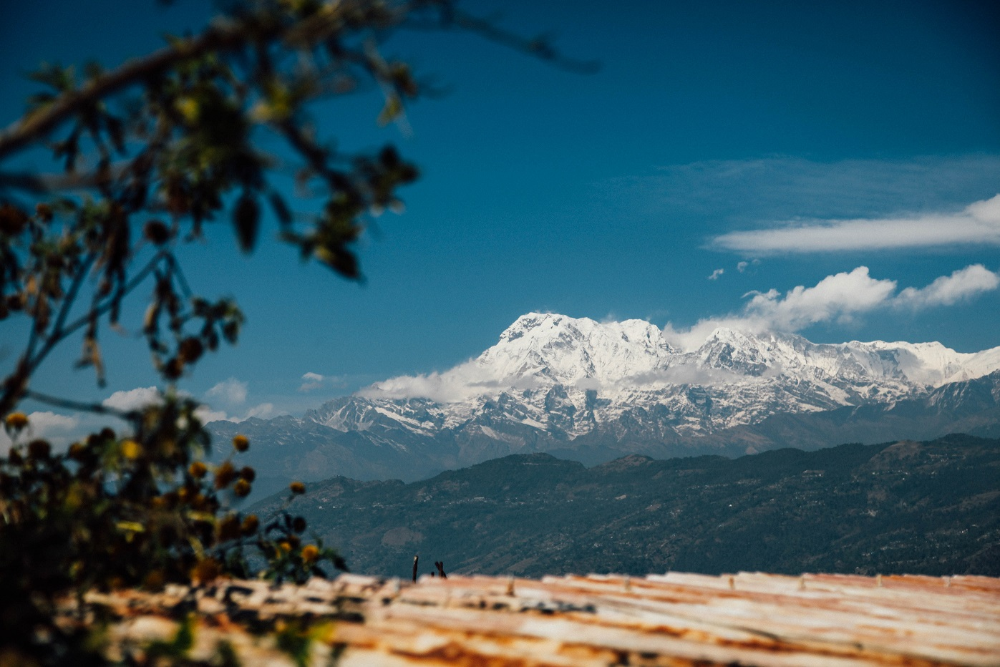

Gray Image


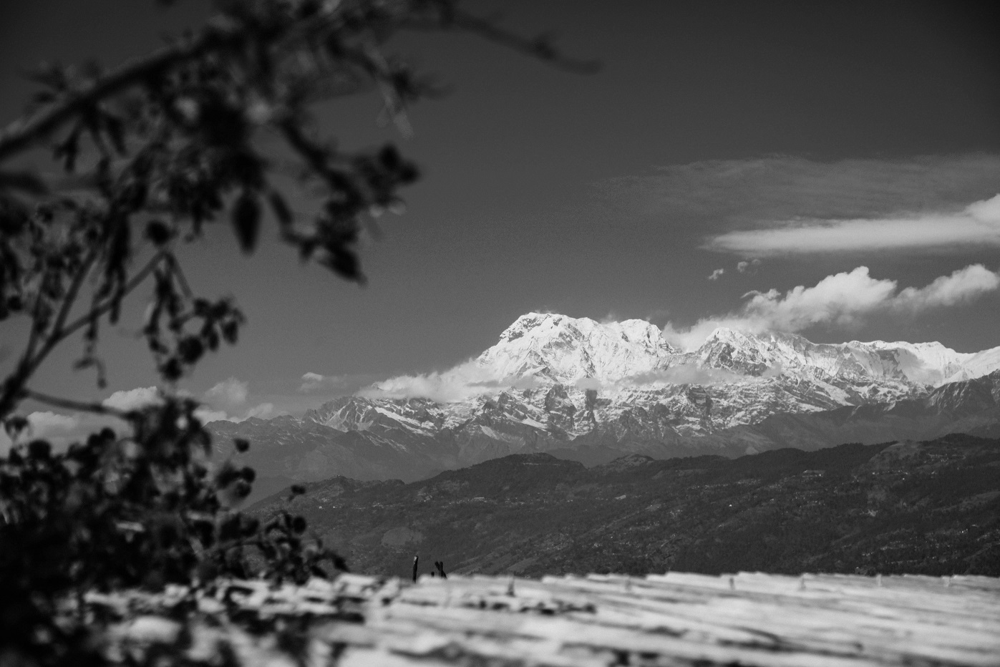

In [ ]:
from google.colab.patches import cv2_imshow

img = cv2.imread('Nepal.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
print("Gray Image")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

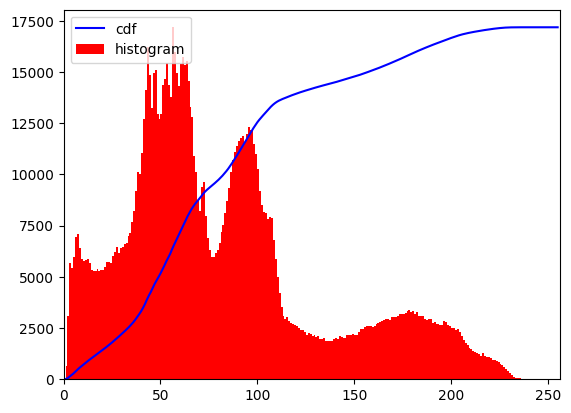

In [ ]:
hist,bins = np.histogram(gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

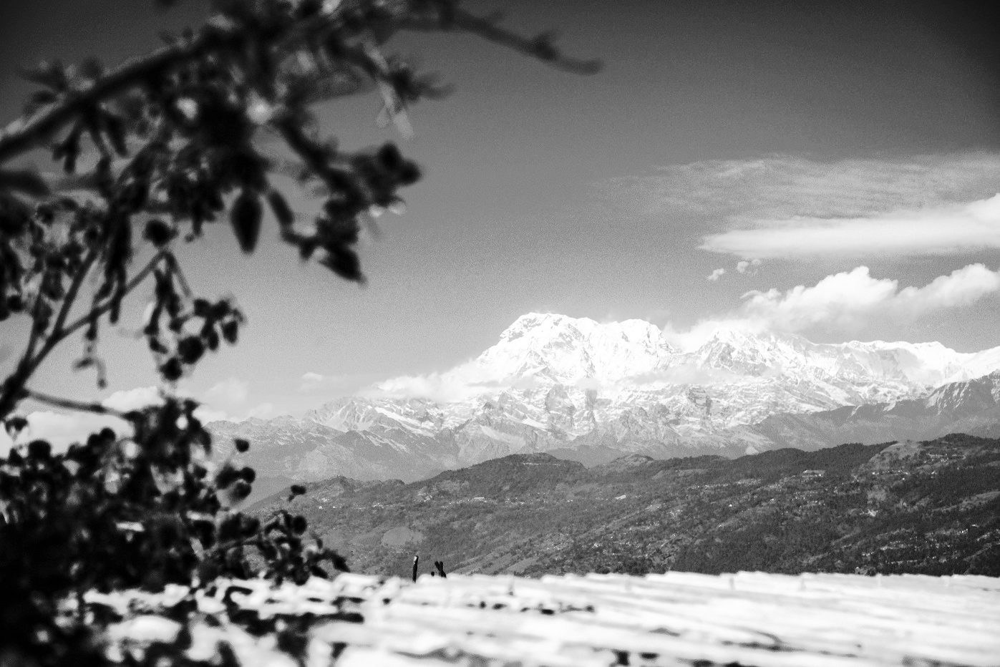

In [ ]:
equ = cv2.equalizeHist(gray)
cv2_imshow(equ)
cv2.waitKey(0)
cv2.destroyAllWindows()

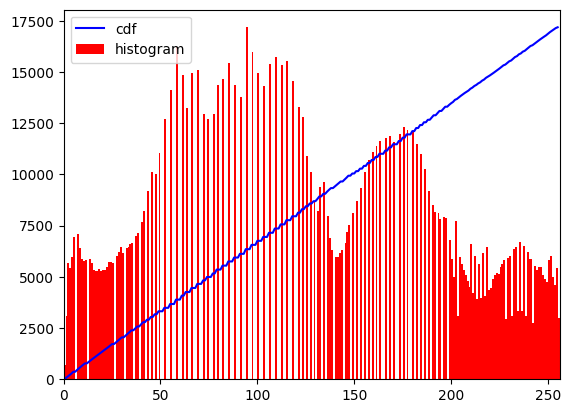

In [ ]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()


## Histogram equalization on color images


In [ ]:
def plot_hist(img,title,ax):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  cdf = hist.cumsum()
  cdf_normalized = cdf * float(hist.max()) / cdf.max()
  ax.plot(cdf_normalized, color = 'b')
  ax.hist(img.flatten(),256,[0,256], color = 'r')
  ax.set_xlim([0,256])
  ax.legend(('cdf','histogram'), loc = 'upper left')
  ax.set_title(title)

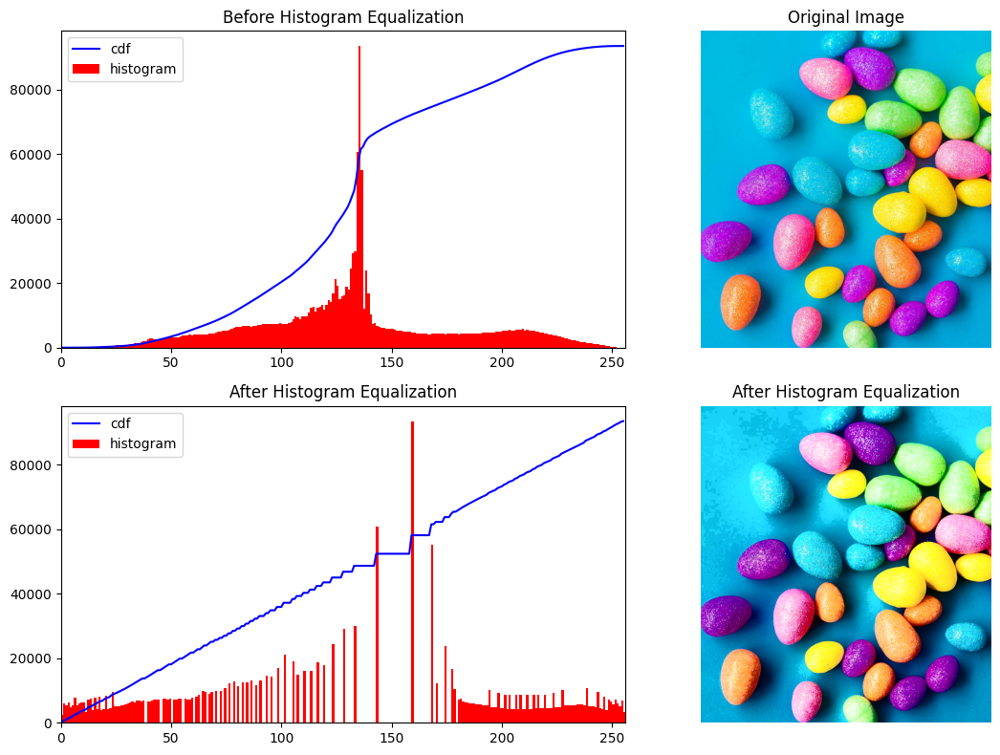

In [ ]:
img = cv2.imread('eggs.jpg')

img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

plot_hist(img_yuv[:,:,0],'Before Histogram Equalization', axes[0,0])

# equalize the histogram of the Y channel
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

plot_hist(img_yuv[:,:,0],'After Histogram Equalization', axes[1,0])

# convert the YUV image back to RGB format
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

axes[0, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Original Image")
axes[0, 1].axis('off')

axes[1, 1].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("After Histogram Equalization")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

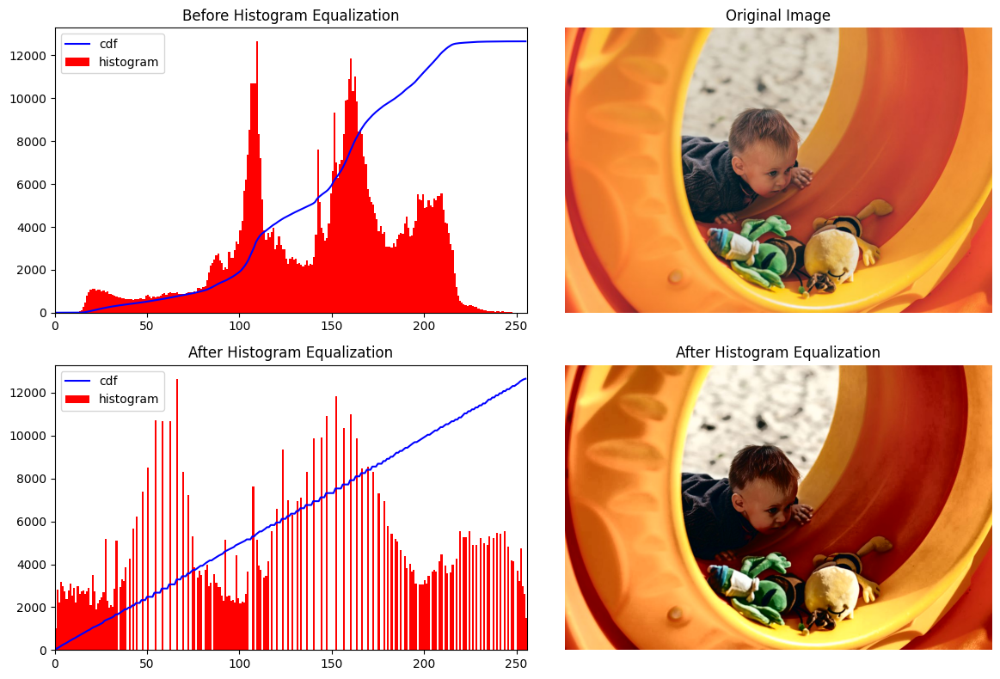

In [ ]:
img = cv2.imread('boy.jpg')

img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

plot_hist(img_yuv[:,:,0],'Before Histogram Equalization', axes[0,0])

# equalize the histogram of the Y channel
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

plot_hist(img_yuv[:,:,0],'After Histogram Equalization', axes[1,0])

# convert the YUV image back to RGB format
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

axes[0, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Original Image")
axes[0, 1].axis('off')

axes[1, 1].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("After Histogram Equalization")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

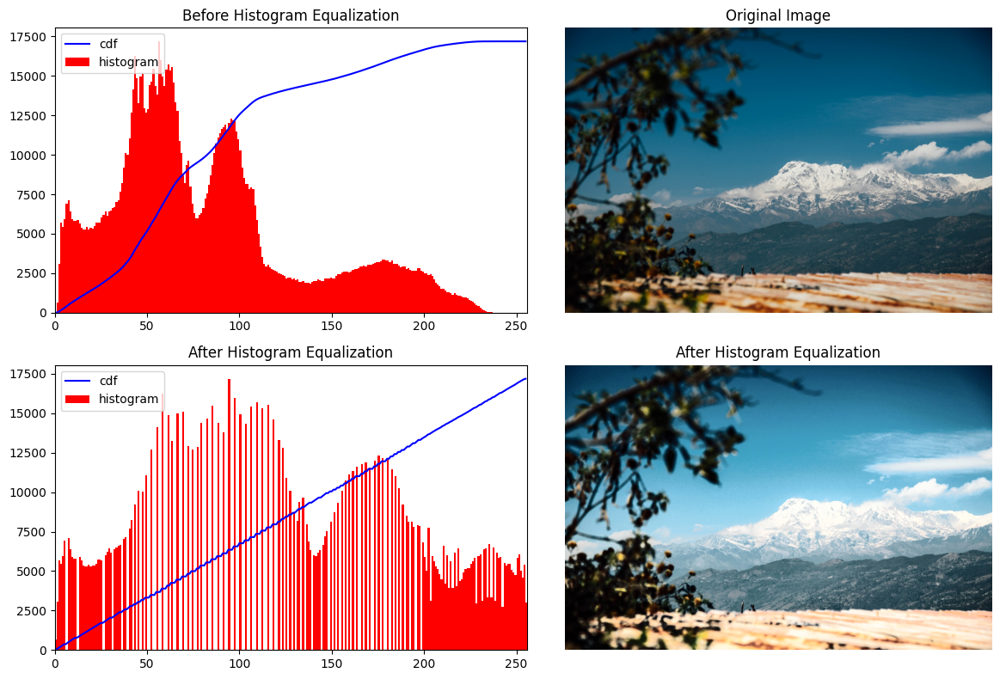

In [ ]:
img = cv2.imread('Nepal.jpg')

img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

plot_hist(img_yuv[:,:,0],'Before Histogram Equalization', axes[0,0])

# equalize the histogram of the Y channel
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

plot_hist(img_yuv[:,:,0],'After Histogram Equalization', axes[1,0])

# convert the YUV image back to RGB format
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

axes[0, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Original Image")
axes[0, 1].axis('off')

axes[1, 1].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("After Histogram Equalization")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

## Why don't we apply histogram equalization on each color channel separately to implement histogram equalization on color images?


**Answer**:

We don't apply histogram equalization on each color channel separately because it can lead to unwanted results. The RBG Channels represent the colour intensity and hence applying histogram equalization to them individually can distort the overall color balance and the relationship between channels. Whenever we apply histogram equalization, we redistribute the pixel intensities inorder to improve the contrast of the image. Since the RGB channels are interdependent, any independent change of their distribution causes huge colour shifts.  For example, if we equalize the Red channel individually, it might intensify or suppress the red tones in an unnatural way compared to the Green and Blue channels, causing unrealistic or odd-looking colors in the image.

In the implementation below, i have equalized on each channel seperately, you can see some significant colour differences in the 'boy.jpg' while other channels are non that much interdependent in the 'Nepal.jpg' and 'eggs.jpg' images.

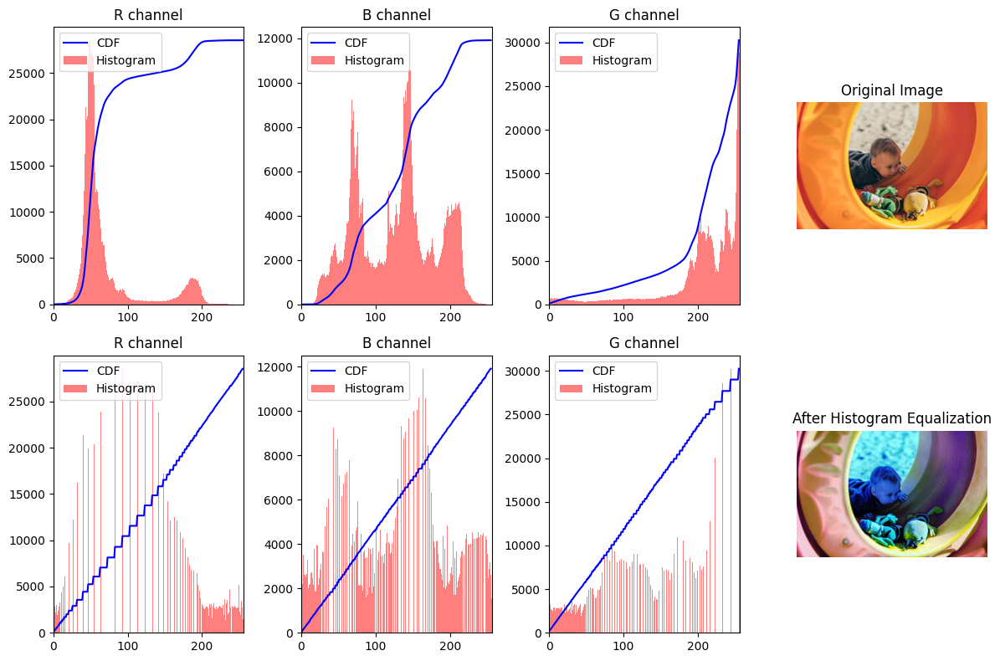

In [ ]:
img = cv2.imread('boy.jpg')

b,g,r = cv2.split(img)

fig, axes = plt.subplots(2, 4, figsize=(12, 8))

plot_hist(b,'R channel', axes[0,0])
plot_hist(g,'B channel', axes[0,1])
plot_hist(r,'G channel', axes[0,2])

# Equalize each channel separately
b_eq = cv2.equalizeHist(b)
g_eq = cv2.equalizeHist(g)
r_eq = cv2.equalizeHist(r)

plot_hist(b_eq,'R channel', axes[1,0])
plot_hist(g_eq,'B channel', axes[1,1])
plot_hist(r_eq,'G channel', axes[1,2])

# convert the YUV image back to RGB format
img_output = cv2.merge([b_eq, g_eq, r_eq])

axes[0, 3].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 3].set_title("Original Image")
axes[0, 3].axis('off')

axes[1, 3].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 3].set_title("After Histogram Equalization")
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

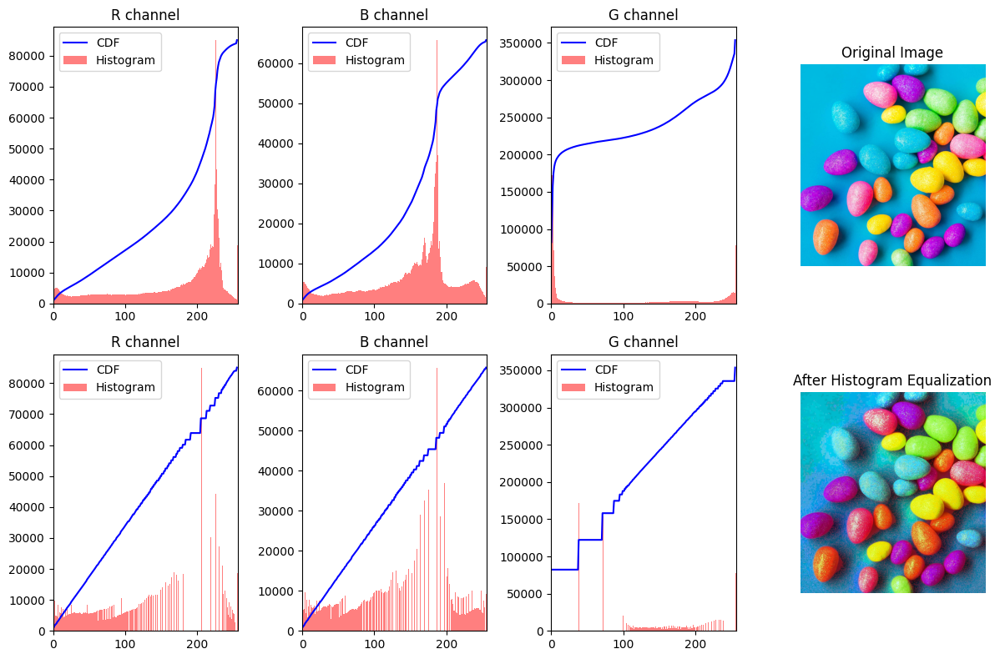

In [ ]:
img = cv2.imread('eggs.jpg')

b,g,r = cv2.split(img)

fig, axes = plt.subplots(2, 4, figsize=(12, 8))

plot_hist(b,'R channel', axes[0,0])
plot_hist(g,'B channel', axes[0,1])
plot_hist(r,'G channel', axes[0,2])

# Equalize each channel separately
b_eq = cv2.equalizeHist(b)
g_eq = cv2.equalizeHist(g)
r_eq = cv2.equalizeHist(r)

plot_hist(b_eq,'R channel', axes[1,0])
plot_hist(g_eq,'B channel', axes[1,1])
plot_hist(r_eq,'G channel', axes[1,2])

# convert the YUV image back to RGB format
img_output = cv2.merge([b_eq, g_eq, r_eq])

axes[0, 3].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 3].set_title("Original Image")
axes[0, 3].axis('off')

axes[1, 3].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 3].set_title("After Histogram Equalization")
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

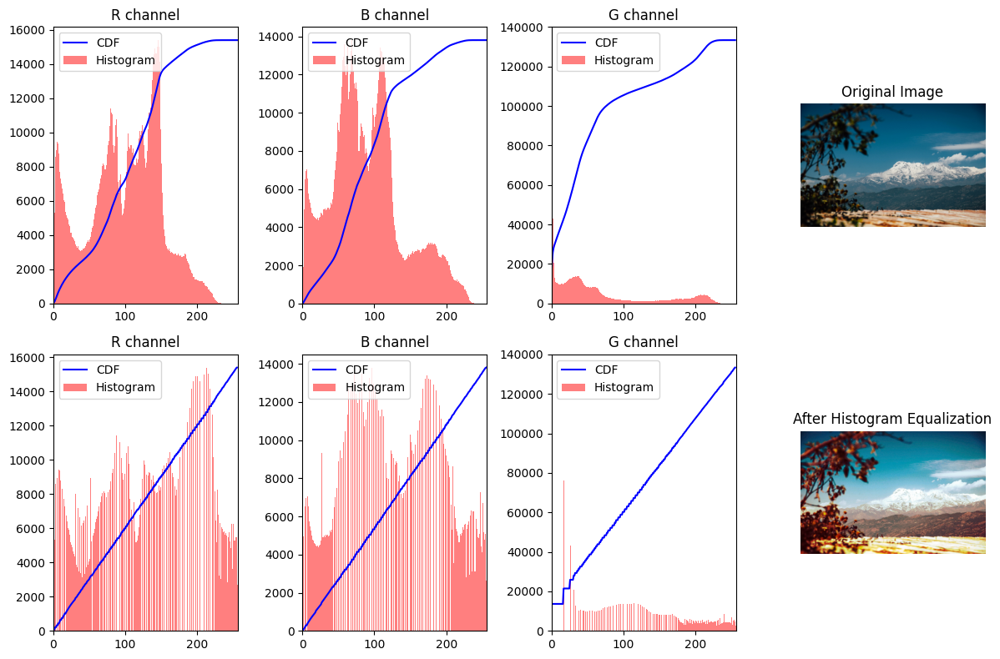

In [ ]:
img = cv2.imread('Nepal.jpg')

b,g,r = cv2.split(img)

fig, axes = plt.subplots(2, 4, figsize=(12, 8))

plot_hist(b,'R channel', axes[0,0])
plot_hist(g,'B channel', axes[0,1])
plot_hist(r,'G channel', axes[0,2])

# Equalize each channel separately
b_eq = cv2.equalizeHist(b)
g_eq = cv2.equalizeHist(g)
r_eq = cv2.equalizeHist(r)

plot_hist(b_eq,'R channel', axes[1,0])
plot_hist(g_eq,'B channel', axes[1,1])
plot_hist(r_eq,'G channel', axes[1,2])

# convert the YUV image back to RGB format
img_output = cv2.merge([b_eq, g_eq, r_eq])

axes[0, 3].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 3].set_title("Original Image")
axes[0, 3].axis('off')

axes[1, 3].imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))
axes[1, 3].set_title("After Histogram Equalization")
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

## Convert RGB image to Ycbcr from opencv

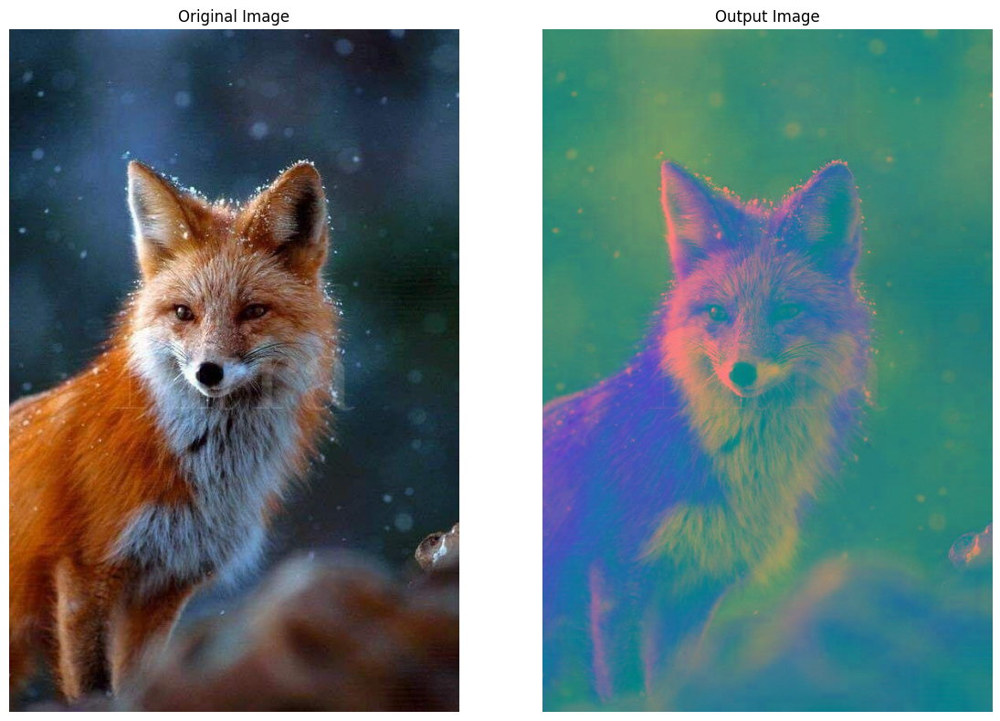

In [ ]:
import requests
from PIL import Image
from io import BytesIO

# Download the image from the Google Drive link
response = requests.get("https://drive.google.com/uc?export=view&id=1DQJX911CMpxMzo6p7f1P--fyHG9UY__u")
my_image = Image.open(BytesIO(response.content))
my_image.save("rbg_image.jpg")

img = cv2.imread('rbg_image.jpg')
img_rbg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(12, 8))

axes[0].imshow(img_rbg)
axes[0].set_title("Original Image")
axes[0].axis('off')

img_op = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

axes[1].imshow(img_op)
axes[1].set_title("Output Image")
axes[1].axis('off')

plt.tight_layout()
plt.show()

## Code to implement Features from Accelerated Segment Test (FAST)


In [ ]:
response = requests.get("https://drive.google.com/uc?export=view&id=1dbeLMpr71fOw9jdv-fMzBhLCwJwhSq_2")
my_image = Image.open(BytesIO(response.content))
my_image.save("faceimg.jpg")

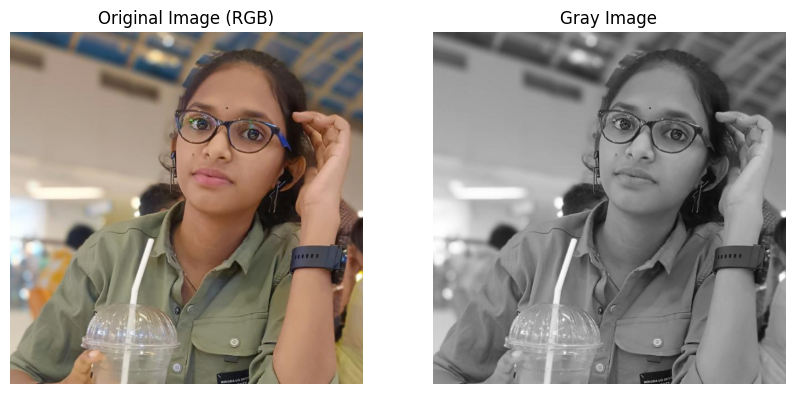

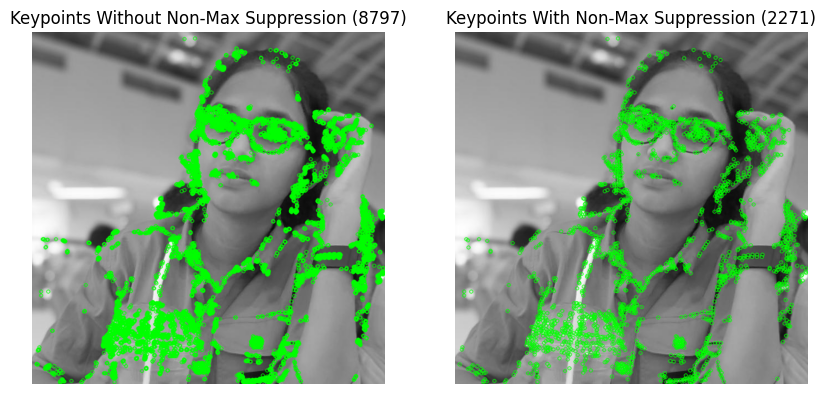

Number of Keypoints Detected Without Non-Max Suppression: 8797
Number of Keypoints Detected With Non-Max Suppression: 2271


In [ ]:
myimg = cv2.imread('faceimg.jpg')

# Convert the image to RGB for consistent plotting
myimg_rgb = cv2.cvtColor(myimg, cv2.COLOR_BGR2RGB)

# Display the original image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(myimg_rgb)
plt.title('Original Image (RGB)')
plt.axis('off')

# Convert to grayscale
gray = cv2.cvtColor(myimg_rgb, cv2.COLOR_RGB2GRAY)

# Display the grayscale image
plt.subplot(1, 2, 2)
plt.imshow(gray, cmap='gray')
plt.title('Gray Image')
plt.axis('off')
plt.show()

#initialize the FAST Detector
fast = cv2.FastFeatureDetector_create()

# Detect keypoints without Non-Max Suppression
fast.setNonmaxSuppression(False)

#find and draw the keypoints
kp_f = fast.detect(gray, None)

img_f = cv2.drawKeypoints(gray, kp_f, None, color=(0,255,0))

# Display keypoints without Non-Max Suppression
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_f)
plt.title(f'Keypoints Without Non-Max Suppression ({len(kp_f)})')
plt.axis('off')

# Detect keypoints with Non-Max Suppression
fast.setNonmaxSuppression(True)

#find and draw the keypoints
kp_t = fast.detect(gray, None)

img_t = cv2.drawKeypoints(gray, kp_t, None, color=(0,255,0))

# Display keypoints with Non-Max Suppression
plt.subplot(1, 2, 2)
plt.imshow(img_t)
plt.title(f'Keypoints With Non-Max Suppression ({len(kp_t)})')
plt.axis('off')
plt.show()

# Print the number of keypoints
print(f'Number of Keypoints Detected Without Non-Max Suppression: {len(kp_f)}')
print(f'Number of Keypoints Detected With Non-Max Suppression: {len(kp_t)}')